Блокнот является демонстационным. Содержит вывод данных после исполнения кода. для корректного исполнения следует последовательно запускать ячейки.

In [35]:
import warnings
warnings.filterwarnings("default", category=FutureWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)


Загружаем данные


In [36]:
import pandas as pd
import numpy as np
import copy
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPRegressor
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
print(tf.__version__)

2.12.0


## Анализ датасета. Общая оценка содержимого


In [37]:
# файлы в прямой видимости программы
df1 = pd.read_excel('D:\Документы\Обучение\МГТУ им Баумана\ВКР\X_bp.xlsx') 
df2 = pd.read_excel('D:\Документы\Обучение\МГТУ им Баумана\ВКР\X_nup.xlsx')
# вывод размерностей
df1.shape,df2.shape 

((1023, 11), (1040, 4))

In [38]:
# объединяем датасеты
df = pd.merge(df1,df2)
# устраняем строки для которых не нашлось индекса (один датасет больше другого)
df.dropna(inplace = True)
df.head()

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [5]:
df.shape,df.columns

((1023, 14),
 Index(['Unnamed: 0', 'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
        'модуль упругости, ГПа', 'Количество отвердителя, м.%',
        'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
        'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
        'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
        'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
       dtype='object'))

In [39]:
df.drop('Unnamed: 0',axis = 1, inplace = True)
print(df.shape)
df.head(1)

(1023, 13)


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.0,22.267857,100.0,210.0,70.0,3000.0,220.0,0,4.0,57.0


Анализ таблицы


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

Описательная статистика 



In [8]:
df.describe() # or 
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


Подсчет уникальных значений по столбцам 

In [9]:
df.nunique()
# для просмотра наличия дуликатов df.duplicated().sum()
# маска с пропущенными значениями df.isna()
# подсчет пропущенных значений df.isna().sum()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

## Разведочный Анализ (EDA)

Гистограммы

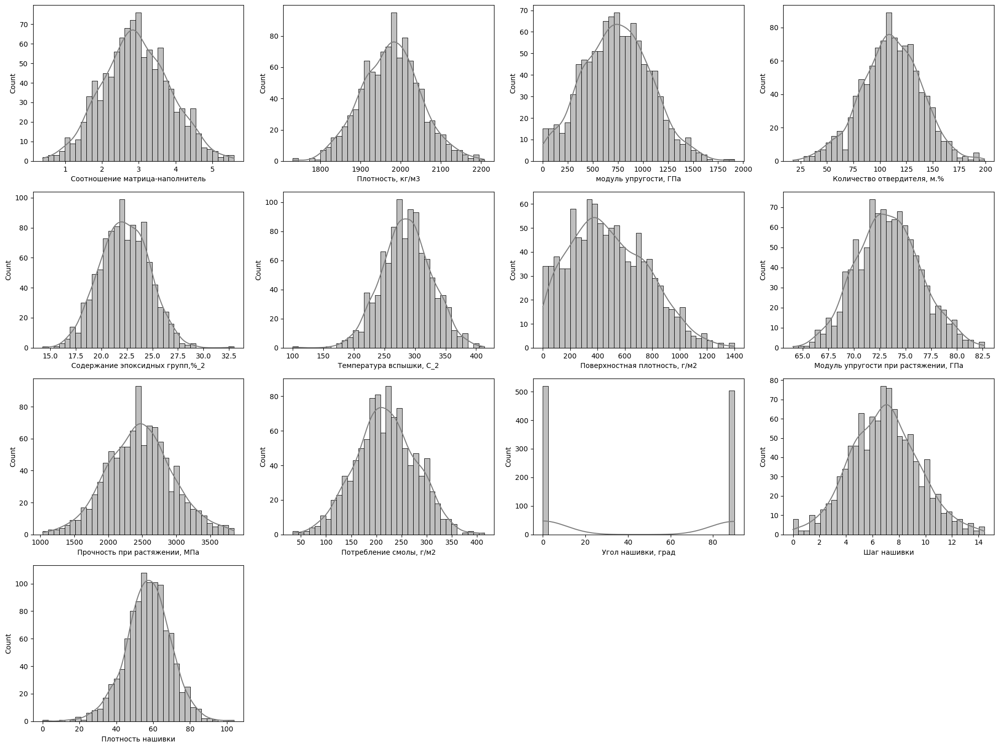

In [40]:
from matplotlib.colorbar import colorbar_factory
def histogram (df, n_rows, n_cols):
    fig=plt.figure(figsize=(20, 15))
    for i, column in enumerate(df.columns):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        sns.histplot(data=df, x=column, kde=True, bins=35, color = 'grey')
    fig.tight_layout()
    plt.show()

histogram(df, 4, 4)

Попарные графики рассеяния

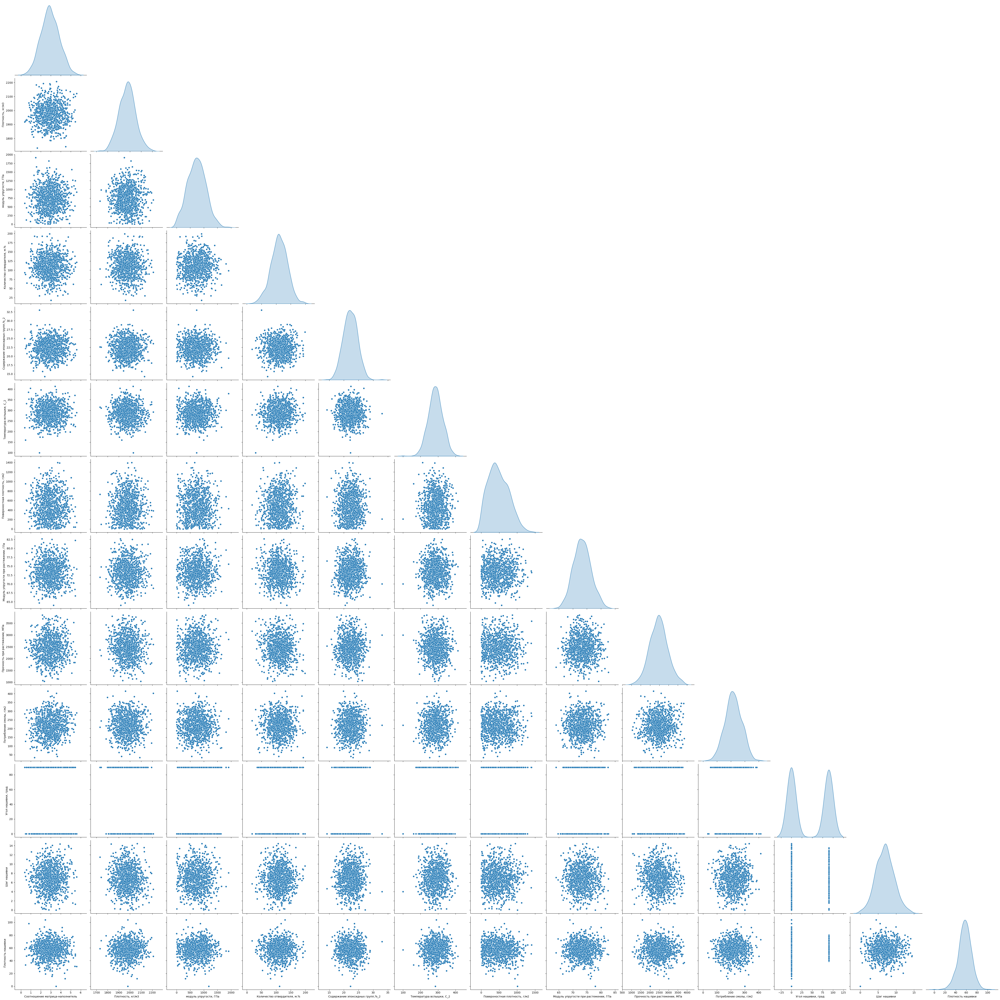

In [12]:
sns.pairplot(df, height=4, diag_kind='kde', corner = True);

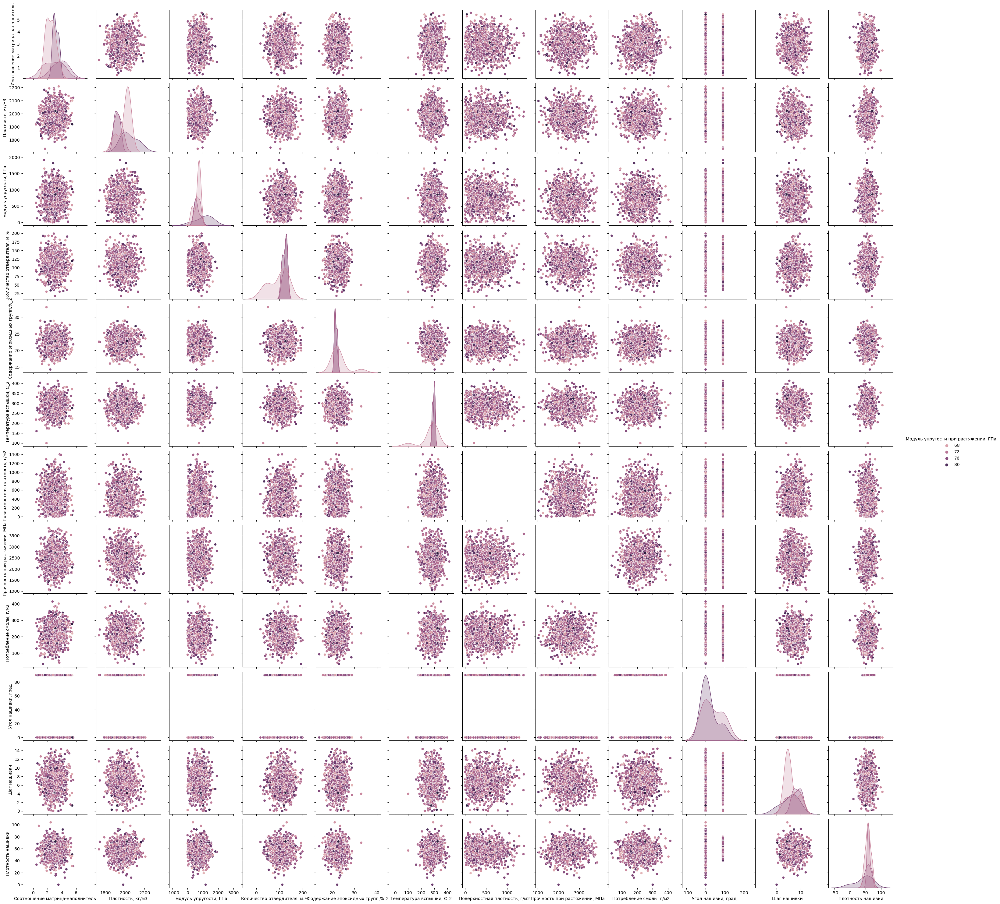

In [13]:
# дополнительные графики попарного рассевиваения  в привязке к целевой переменной
sns.pairplot(df, hue="Модуль упругости при растяжении, ГПа")


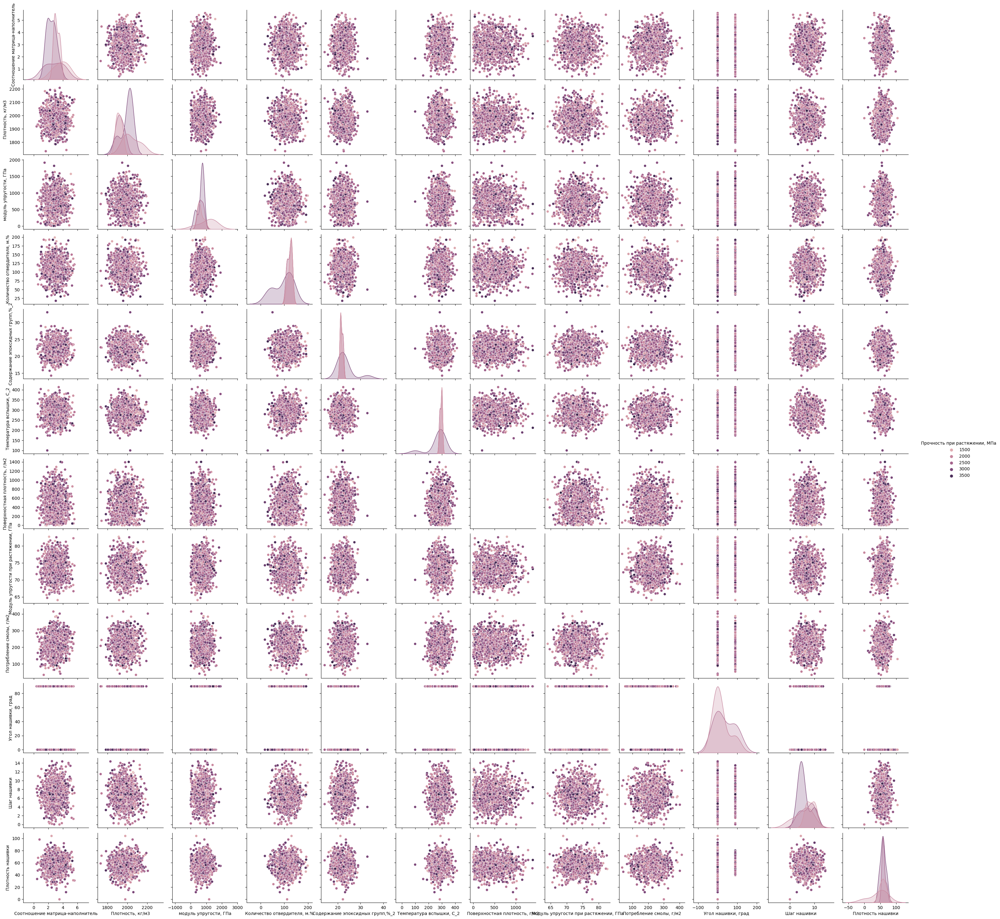

In [14]:
# дополнительные графики попарного рассевиваения  в привязке к целевой переменной
sns.pairplot(df, hue="Прочность при растяжении, МПа")

Матрица корреляции

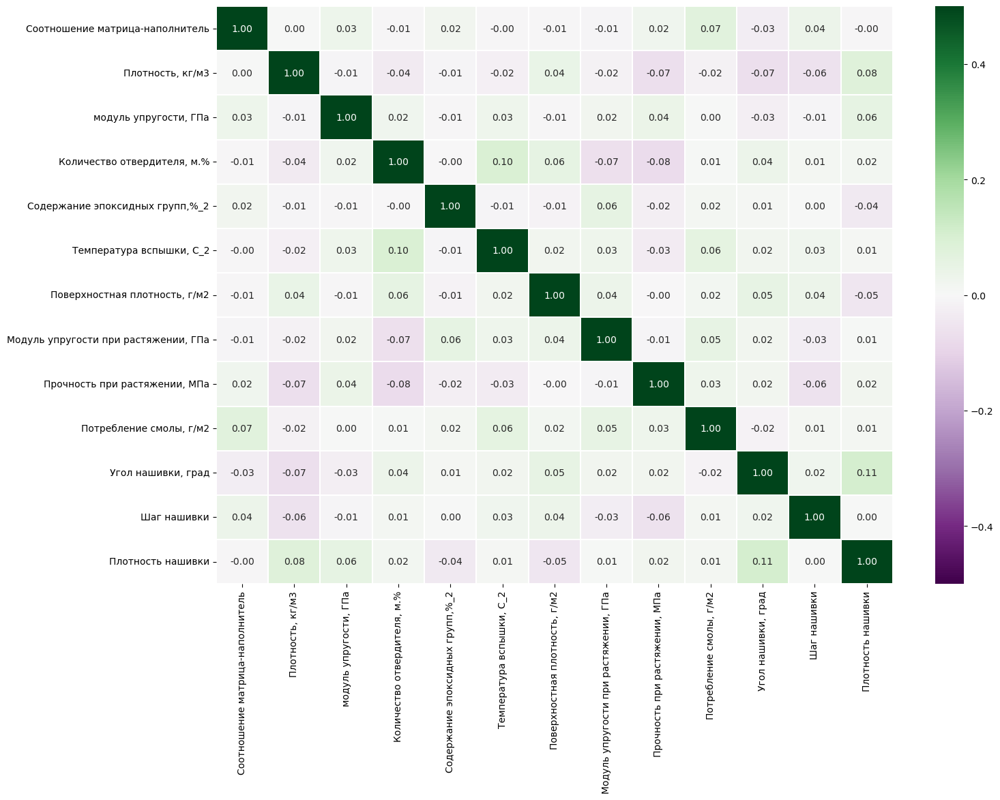

In [41]:
def get_corr(df):
  corr = df.corr()
  fig, ax = plt.subplots(figsize=(16, 11))
  sns.heatmap(corr, vmin=-0.5, vmax=0.5, annot=True, fmt='.2f',cmap='PRGn', ax=ax, linewidths = 0.1)
  plt.show()
get_corr(df)

Диаграмма "Ящик с усами" (Boxplot)

In [16]:
''' в данном случае блок мало информативен
def box_pl1(df):
  columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
          'модуль упругости, ГПа', 'Количество отвердителя, м.%',
          'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
          'Поверхностная плотность, г/м2', 
          'Потребление смолы, г/м2',
          'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
  fig, axs = plt.subplots(ncols=12, figsize=(32,9))
  for i, column in enumerate(df[columns]):
    sns.boxplot(data=df, x=column, y='Модуль упругости при растяжении, ГПа', ax=axs[i])


  fig, axs = plt.subplots(ncols=12, figsize=(32,9))
  for i, column in enumerate(df[columns]):
    sns.boxplot(data=df, x=column, y='Прочность при растяжении, МПа', ax=axs[i])
box_pl1(df) '''

" в данном случае блок мало информативен\ndef box_pl1(df):\n  columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',\n          'модуль упругости, ГПа', 'Количество отвердителя, м.%',\n          'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',\n          'Поверхностная плотность, г/м2', \n          'Потребление смолы, г/м2',\n          'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']\n  fig, axs = plt.subplots(ncols=12, figsize=(32,9))\n  for i, column in enumerate(df[columns]):\n    sns.boxplot(data=df, x=column, y='Модуль упругости при растяжении, ГПа', ax=axs[i])\n\n\n  fig, axs = plt.subplots(ncols=12, figsize=(32,9))\n  for i, column in enumerate(df[columns]):\n    sns.boxplot(data=df, x=column, y='Прочность при растяжении, МПа', ax=axs[i])\nbox_pl1(df) "

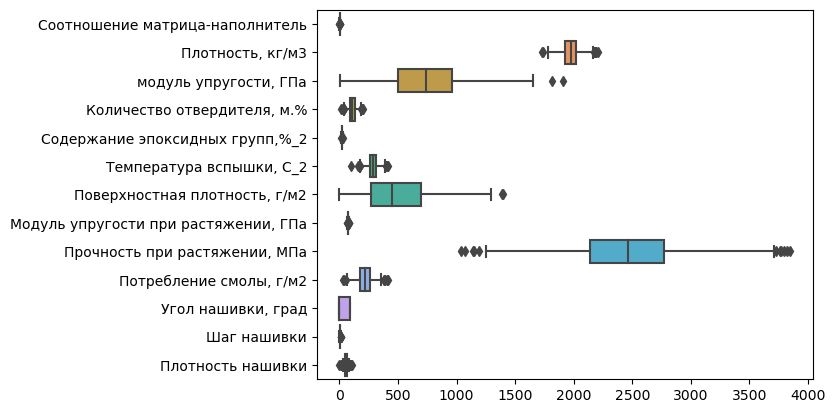

In [17]:
# box_plot на маленьком поле
def box_plt3(df):
  sns.boxplot(data = df, orient="h")
  plt.show()
box_plt3(df)

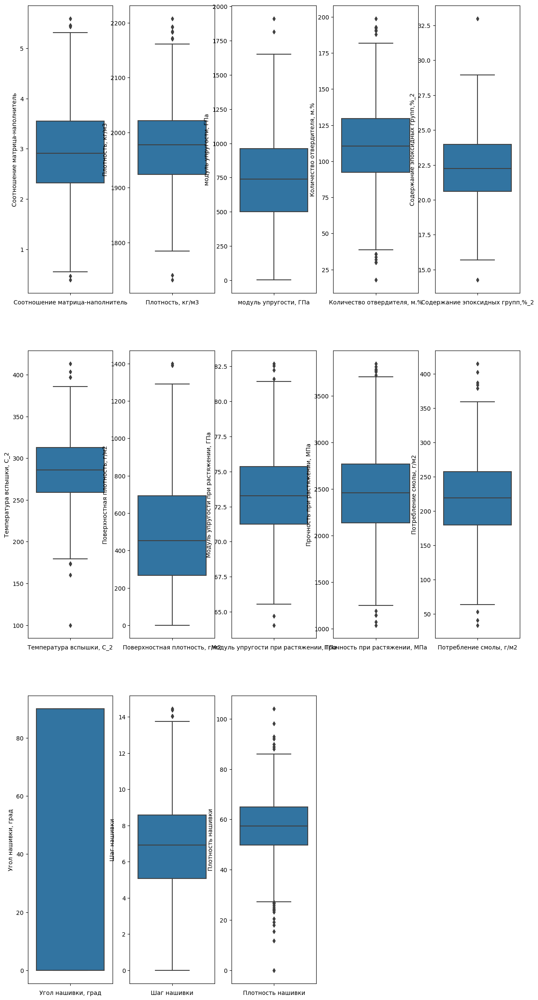

In [18]:
# box plot раздельный
def box_pl2(df):
  col = 5  # столбцы
  k = 1  # счетчик
  row = 3  # строки

  fig = plt.figure(figsize=(15, 30))

  for i in df.columns:
      plt.subplot(row, col, k)
      plt.xlabel(i)
      sns.boxplot(y = df[i])
      k+=1
    
  plt.show()
box_pl2(df)

Удаление выбросов методом межквартильных расстояний

In [42]:
for i in df.columns:
    q75, q25 = np.percentile(df.loc[:,i], [75,25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    df.loc[df[i] < min, i] = np.nan
    df.loc[df[i] > max, i] = np.nan
df.dropna(inplace = True)

"Ящик с усами" после удаления выбросов

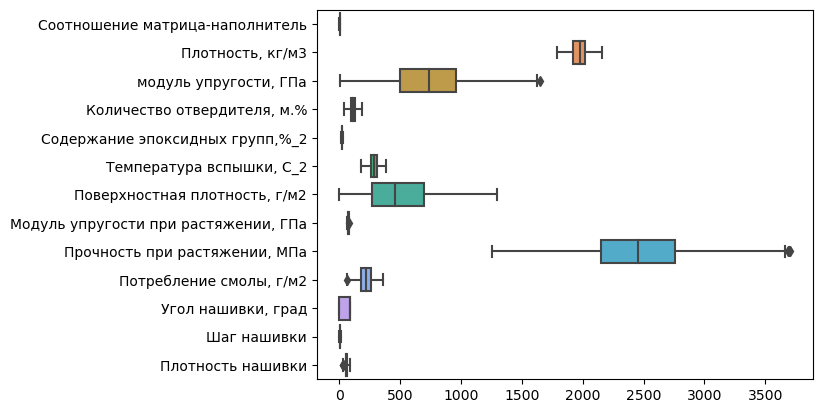

In [20]:
# box_pl2(df)
sns.boxplot(data = df, orient="h")
plt.show()

In [21]:
df.shape

(936, 13)

Оценка плотности ядра

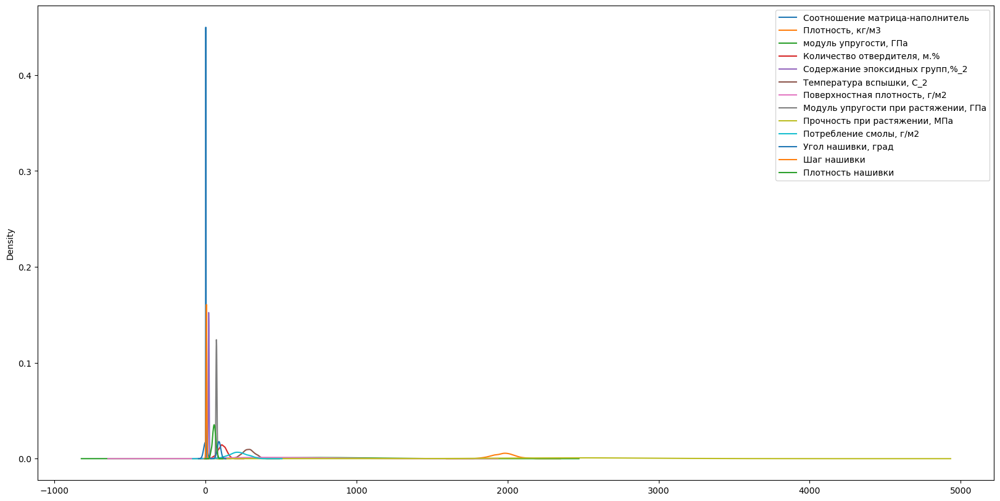

In [43]:
def plt_kde(df):
  fig, ax = plt.subplots(figsize=(20, 10))
  df.plot(kind='kde', ax=ax)
plt_kde(df)

Нормализуем

In [44]:
scaler = preprocessing.MinMaxScaler()
columns = df.columns
df_n = scaler.fit_transform(np.array(df))
df_n = pd.DataFrame(df_n, columns=columns)
df_n.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.289334,0.557156
1,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.335840
2,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.506083
3,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.557156
4,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.0,0.362355,0.727399


In [45]:
scaler.inverse_transform(np.array(df_n)[:1,:])

array([[1.85714286e+00, 2.03000000e+03, 7.38736842e+02, 5.00000000e+01,
        2.37500000e+01, 2.84615385e+02, 2.10000000e+02, 7.00000000e+01,
        3.00000000e+03, 2.20000000e+02, 0.00000000e+00, 4.00000000e+00,
        6.00000000e+01]])

Описательная статистика характеристик после нормализации

In [25]:
df_n.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,936.0,0.50,0.19,0.0,0.37,0.49,0.63,1.0
"Плотность, кг/м3",936.0,0.50,0.19,0.0,0.37,0.51,0.62,1.0
"модуль упругости, ГПа",936.0,0.45,0.20,0.0,0.30,0.45,0.58,1.0
"Количество отвердителя, м.%",936.0,0.50,0.19,0.0,0.38,0.51,0.64,1.0
"Содержание эпоксидных групп,%_2",936.0,0.49,0.18,0.0,0.37,0.49,0.62,1.0
"Температура вспышки, С_2",936.0,0.52,0.19,0.0,0.39,0.52,0.65,1.0
"Поверхностная плотность, г/м2",936.0,0.37,0.22,0.0,0.21,0.35,0.54,1.0
"Модуль упругости при растяжении, ГПа",936.0,0.49,0.19,0.0,0.36,0.49,0.62,1.0
"Прочность при растяжении, МПа",936.0,0.50,0.19,0.0,0.37,0.49,0.61,1.0
"Потребление смолы, г/м2",936.0,0.52,0.20,0.0,0.39,0.52,0.65,1.0


Оценим ящик с усами после нормализации

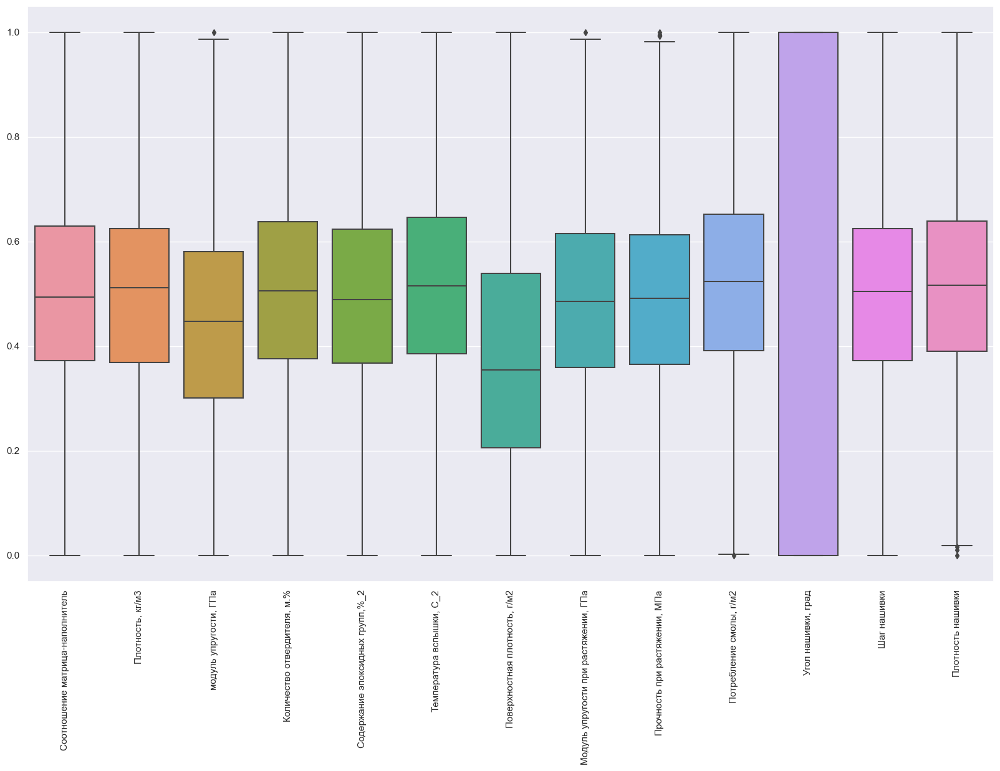

In [26]:
sns.set(rc={'figure.figsize':(20,12)})
ax = sns.boxplot(data=df_n)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

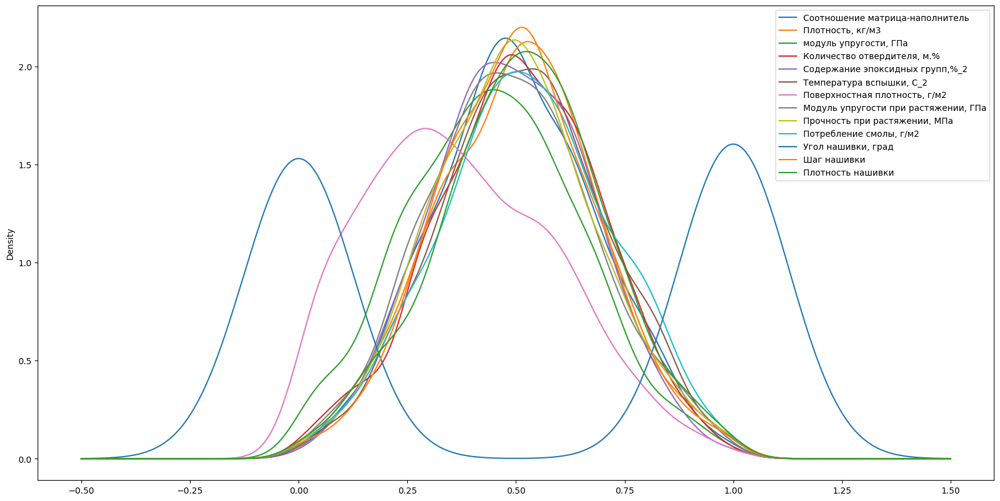

In [46]:
# распредление после нормализации
plt_kde(df_n)

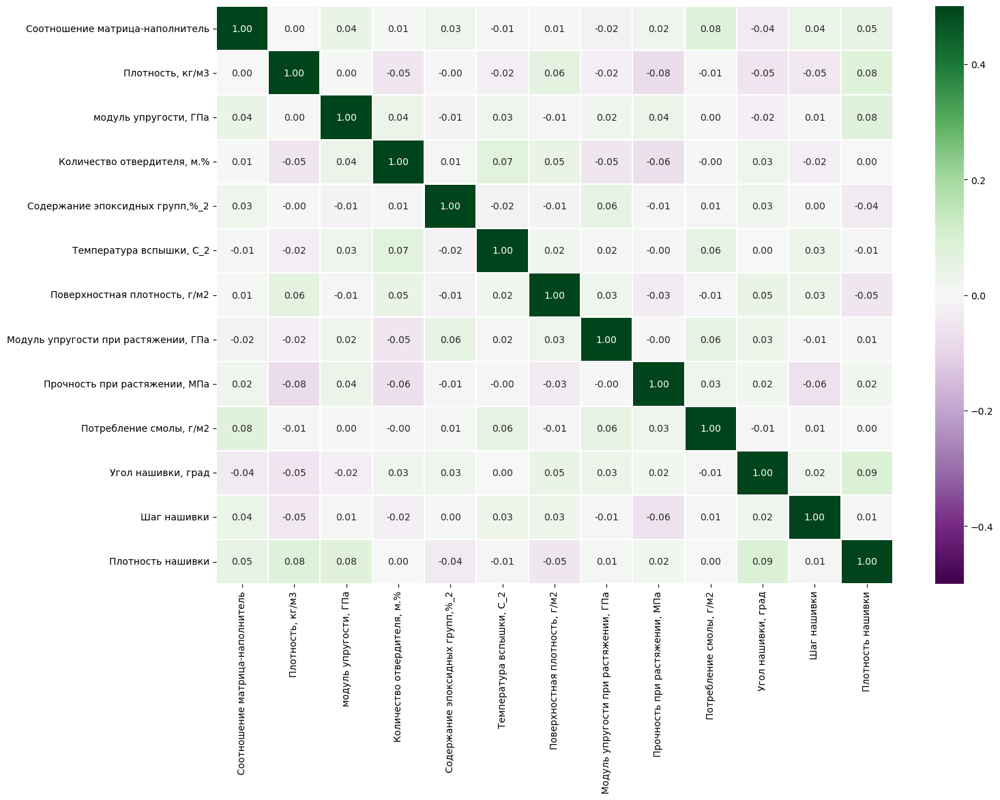

In [47]:
# Корреялция после нормализации
get_corr(df_n)

##Модели для прогноза модуля упругости при растяжении и прочности при растяжении.


In [48]:
#Визуализация предсказанных значений целевых переменных
def predicted_plot(y_test, y_pred, model_name):
  plt.figure(figsize=(15,9))
  plt.title(f'Тестовые и прогнозные значения, Модуль 1: {model_name}')
  plt.plot(y_test.to_numpy()[:,0], label='Тест')
  plt.plot(y_pred[:,0], label='Прогноз')
  plt.legend(loc='best')
  plt.ylabel('н')
  plt.xlabel('Порядок')

  plt.figure(figsize=(15,9))
  plt.title(f'Тестовые и прогнозные значения, Модуль 2: {model_name}')
  plt.plot(y_test.to_numpy()[:,1], label='Тест')
  plt.plot(y_pred[:,1], label='Прогноз')
  plt.legend(loc='best')
  plt.ylabel('н')
  plt.xlabel('Порядок')
# Для одной целевой переменной
def predicted_ns(y_test, y_pred):
  plt.figure(figsize=(15,9))
  plt.title(f'Тест и прогноз, Соотношение М-Н: ')
  plt.plot(y_test.to_numpy(), label='Тест')
  plt.plot(y_pred, label='Прогноз')
  plt.legend(loc='best')
  plt.ylabel('н')
  plt.xlabel('Порядок')

Входы и выходы для моделей

In [49]:
from joblib import dump, load
minmax_y = MinMaxScaler()  
minmax_x = MinMaxScaler()
y_label = ['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
minmax_y.fit(df[y_label])
minmax_x.fit(df.drop(y_label, axis = 1))

# Сохраним масштабаторы для x и y
from joblib import dump, load
dump(minmax_y, 'minmax_y.joblin')
dump(minmax_x, 'minmax_x.joblin')

['minmax_x.joblin']

In [50]:
# проверим
minmax_y_l = load('minmax_y.joblin')
x1 = minmax_y_l.inverse_transform(np.array([0.34,0.77]).reshape(1,-1))
x1[0][0], x1[0][1]

(70.94702452175962, 3140.958187495646)

In [51]:

y_label = ['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
y = df_n[y_label] 
X = df_n.drop(y_label, axis = 1)
y.shape,X.shape

((936, 2), (936, 11))

In [ ]:
# scaler_y.inverse_transform(y)

Разделяем датасет на обучающую и тестовую выборки


In [52]:
model_list = [] # список в котором будем хранить лучше модели
X_train, X_test, y_train,y_test = train_test_split(X, y , test_size=0.3, random_state=42)


Итоговый датасет ошибок


In [54]:
loss_df = pd.DataFrame(columns=['target','model','MSE','MSE_0','MSE_1','R2','R2_0','R2_1'])


Линейная регрессия


In [55]:
X_train.dropna().shape, X_train.shape

((655, 11), (655, 11))

In [56]:
# модуль упругости при растяжении
del loss_df
loss_df =pd.DataFrame([])
model = LinearRegression()
model.fit(X_train,  y_train)
y_pred = model.predict(X_test)


model_name = 'Linear Regression'
def add_loss(loss_df, model_name,y_test, y_pred):
  MSE = mean_squared_error(y_test, y_pred)
  R2 = r2_score(y_test, y_pred)
  R2_0 = r2_score(y_test[y_label[0]],y_pred[:,0])
  R2_1 = r2_score(y_test[y_label[1]],y_pred[:,1])
  MSE_0 = mean_squared_error(y_test[y_label[0]],y_pred[:,0])
  MSE_1 = mean_squared_error(y_test[y_label[1]],y_pred[:,1])
  # без индекса общая
  #_0 'Модуль упругости при растяжении'
  #_1 'Прочность при растяжении, МПа'
  df = pd.DataFrame({'model':model_name,\
                     'target':['Модуль упругости и Прочность'],\
                     'MSE': MSE,\
                     'MSE_0': MSE_0,\
                     'MSE_1': MSE_1,\
                     'R2':R2,\
                     'R2_0': R2_0,\
                     'R2_1': R2_1})
  # print(df.head())
  loss_df = pd.concat([loss_df, df],ignore_index=True)
  return loss_df
model_list.append(model)
loss_df = add_loss(loss_df, model_name, y_test, y_pred)
# loss_df 'Linear Regression'

In [57]:
# соотствие между метриками для общей и по отдельности
mean_squared_error(y_test, y_pred), (mean_squared_error(y_test[y_label[0]],y_pred[:,0]) + mean_squared_error(y_test[y_label[1]],y_pred[:,1]))/2

(0.03507387196817088, 0.03507387196817088)

In [58]:
loss_df

,model,target,MSE,MSE_0,MSE_1,R2,R2_0,R2_1
0,Linear Regression,Модуль упругости и Прочность,0.035074,0.034752,0.035396,-0.024522,-0.003601,-0.045443


In [20]:
y_test.shape, y_pred.shape

((281, 2), (281, 2))

In [21]:
loss_df.head()

,model,target,MSE,MSE_0,MSE_1,R2,R2_0,R2_1
0,Linear Regression,Модуль упругости и Прочность,0.035074,0.034752,0.035396,-0.024522,-0.003601,-0.045443


Визуализация

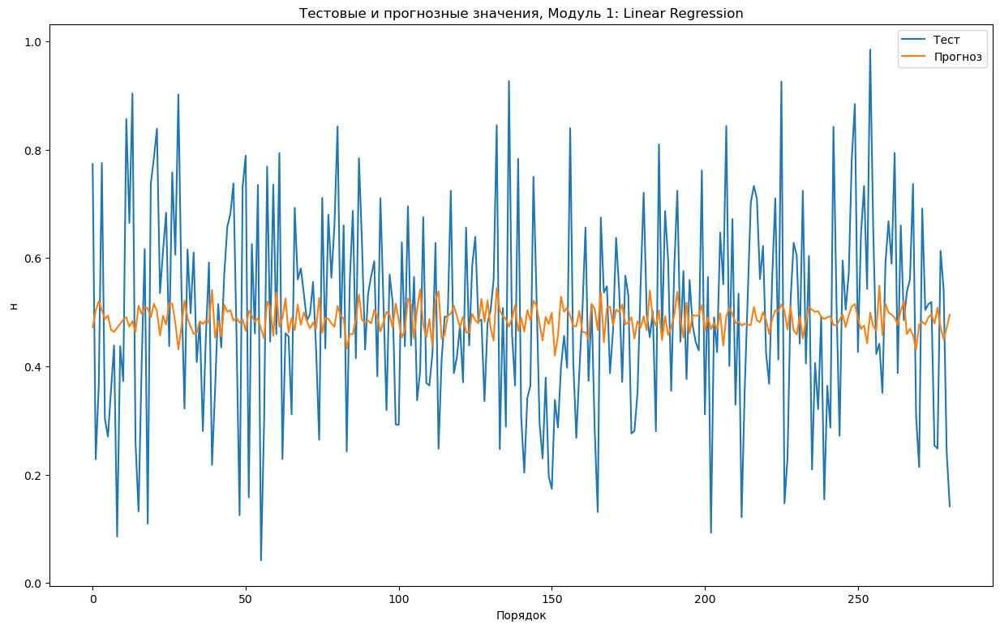

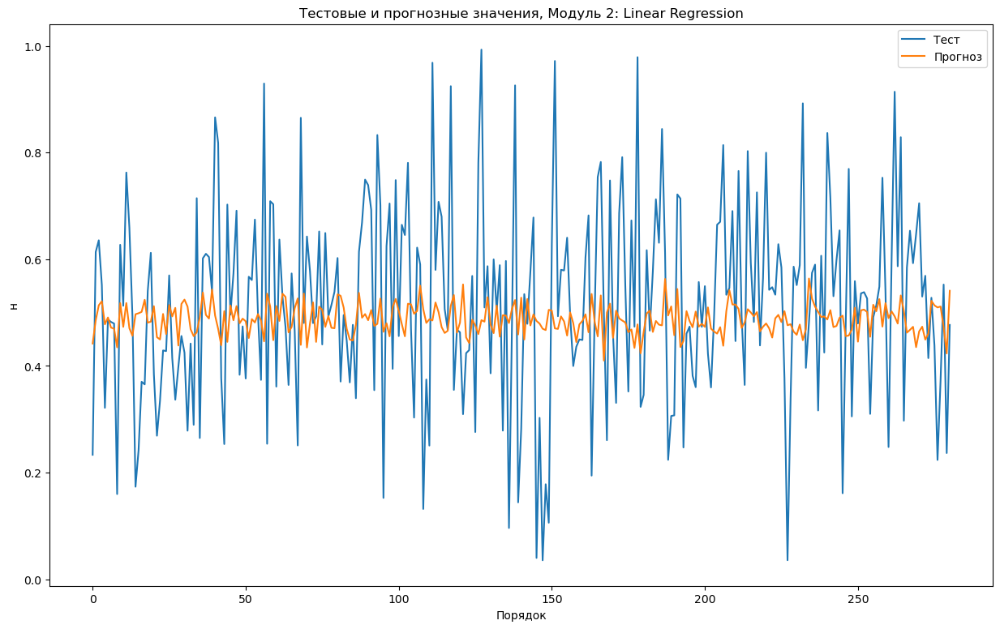

In [22]:
predicted_plot(y_test, y_pred, model_name)

Регрессия k-ближайших соседей


In [59]:

#model = KNeighborsRegressor(random_state = 42)
#random_seed(42)
model = KNeighborsRegressor()
grid = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10,verbose = 1)
gsc.fit(X_train,  y_train)
model = gsc.best_estimator_
model.fit(X_train,  y_train)
y_pred = model.predict(X_test)
model_name = 'KNeighborsRegressor'
model_list.append(model)
loss_df = add_loss(loss_df,model_name,y_test, y_pred)
model

Fitting 10 folds for each of 800 candidates, totalling 8000 fits


KNeighborsRegressor(n_neighbors=100)

In [24]:
loss_df.head()

,model,target,MSE,MSE_0,MSE_1,R2,R2_0,R2_1
0,Linear Regression,Модуль упругости и Прочность,0.035074,0.034752,0.035396,-0.024522,-0.003601,-0.045443
1,KNeighborsRegressor,Модуль упругости и Прочность,0.034788,0.034654,0.034921,-0.016102,-0.000792,-0.031412


Визуализация

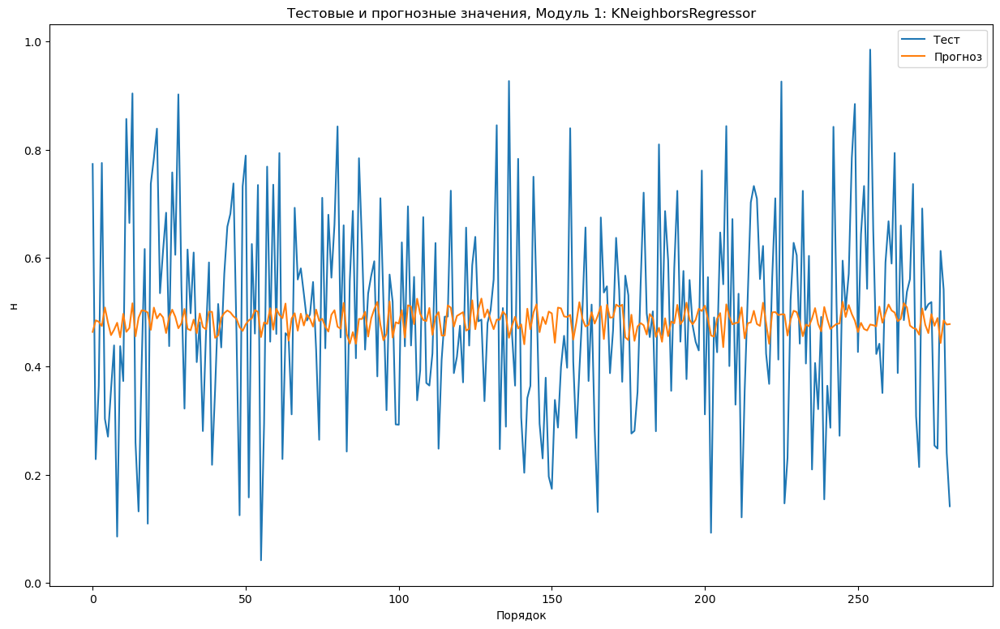

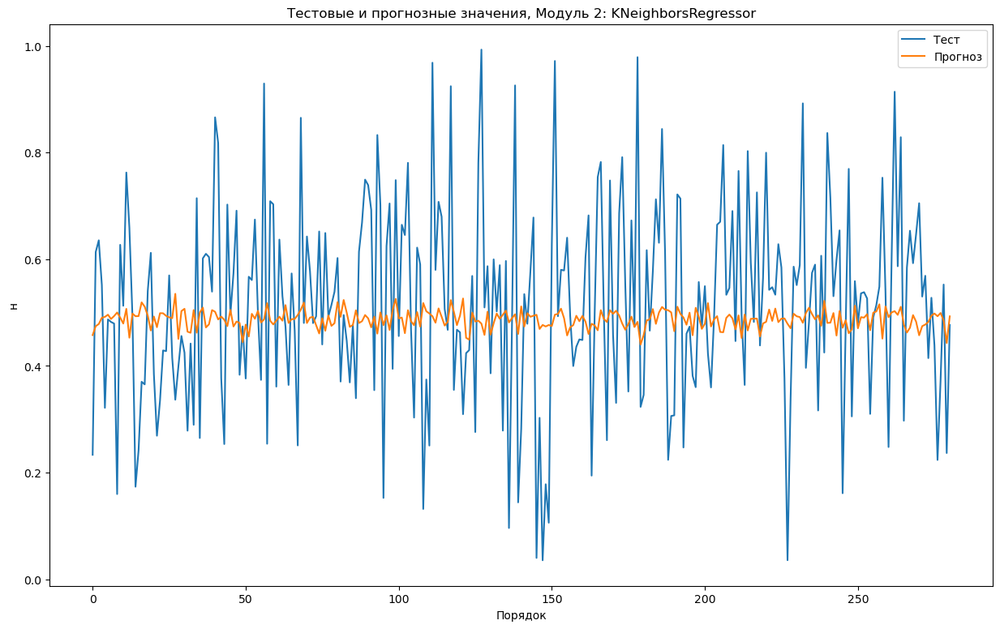

In [25]:
predicted_plot(y_test, y_pred,model_name)

In [26]:
loss_df.head()

,model,target,MSE,MSE_0,MSE_1,R2,R2_0,R2_1
0,Linear Regression,Модуль упругости и Прочность,0.035074,0.034752,0.035396,-0.024522,-0.003601,-0.045443
1,KNeighborsRegressor,Модуль упругости и Прочность,0.034788,0.034654,0.034921,-0.016102,-0.000792,-0.031412


SVR

In [60]:
def fit_model(model,model_name,grid,loss_df, y_test, y_pred):
  gsc = GridSearchCV(model, grid, n_jobs=-1, cv=10)
  gsc.fit(X_train,  y_train)
  model = gsc.best_estimator_
  model.fit(X_train,  y_train)
  y_pred = model.predict(X_test)
  
  model_list.append(model)
  loss_df = add_loss(loss_df,model_name, y_test, y_pred)
  predicted_plot(y_test, y_pred,model_name)
  return loss_df 

MultiOutputRegressor(estimator=SVR(epsilon=0.5))

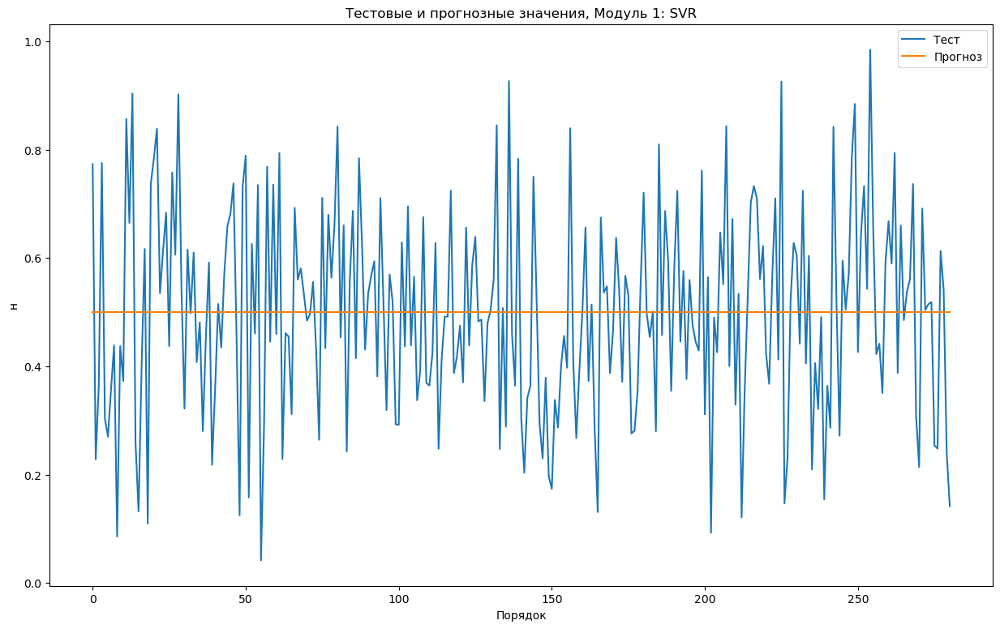

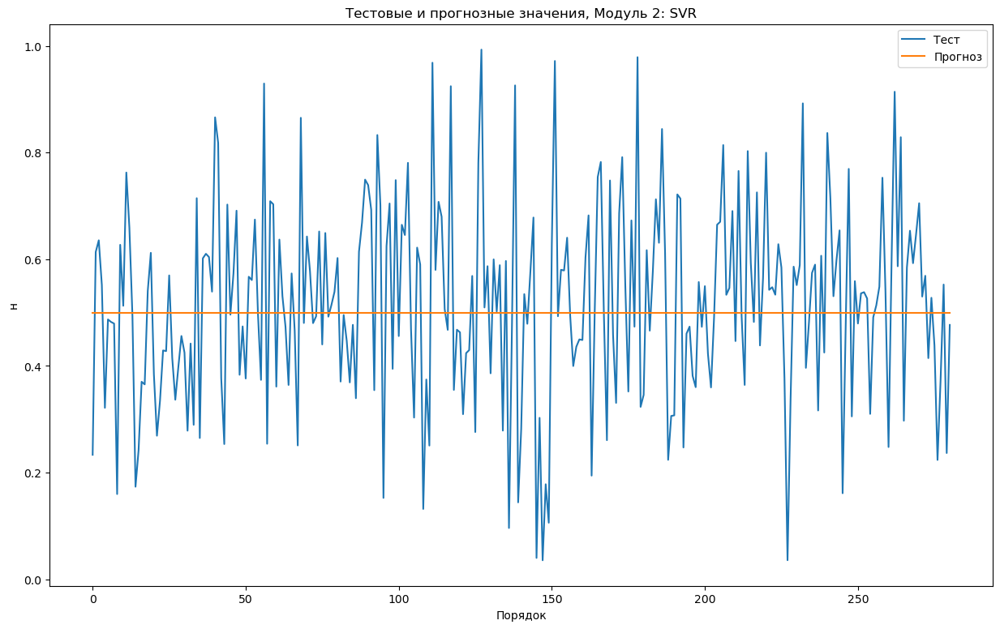

In [61]:
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor
grid = {
    'estimator__C':np.arange(1.0,5.5,0.5),
    'estimator__epsilon':np.arange(0.1,1.1,0.1)}

model = MultiOutputRegressor(SVR())
model_name = 'SVR'
loss_df = fit_model(model,model_name, grid,loss_df, y_test, y_pred)
model_list[-1]

In [62]:
loss_df

,model,target,MSE,MSE_0,MSE_1,R2,R2_0,R2_1
0,Linear Regression,Модуль упругости и Прочность,0.035074,0.034752,0.035396,-0.024522,-0.003601,-0.045443
1,KNeighborsRegressor,Модуль упругости и Прочность,0.034788,0.034654,0.034921,-0.016102,-0.000792,-0.031412
2,SVR,Модуль упругости и Прочность,0.034403,0.034629,0.034177,-0.004750,-0.000051,-0.009448


RandomForest

D:\Users\79649\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
120 fits failed out of a total of 600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
120 fits failed with the following error:
Traceback (most recent call last):
  File "D:\Users\79649\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "D:\Users\79649\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 392, in fit
    self._validate_estimator()
  File "D:\Users\79649\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 138, in _validate_estimator
    raise ValueError(
ValueError: n_estimators must be greater tha

RandomForestRegressor(max_depth=1, max_features='sqrt', n_estimators=75,
                      random_state=14)

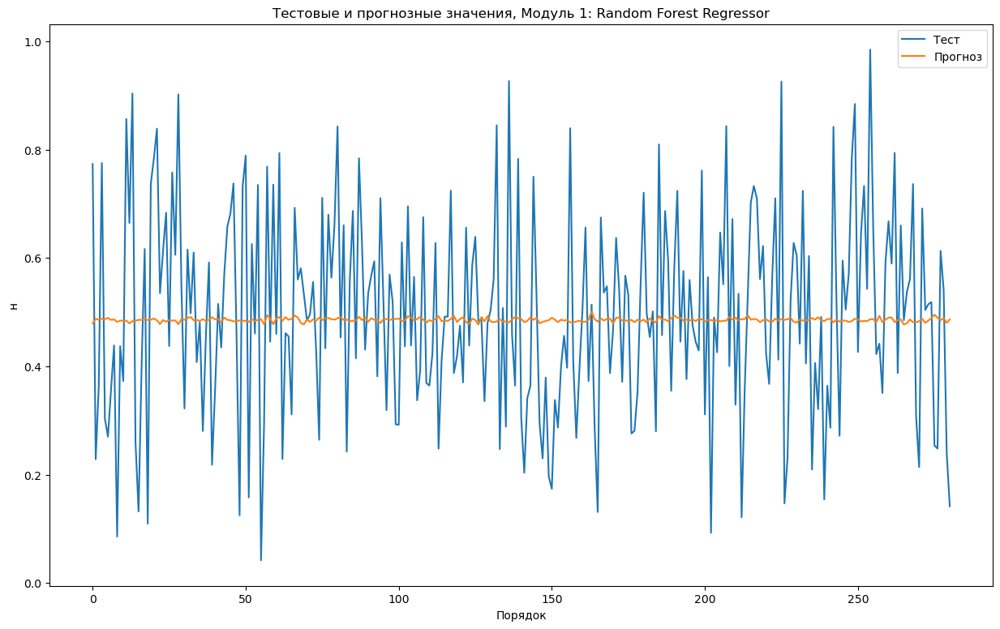

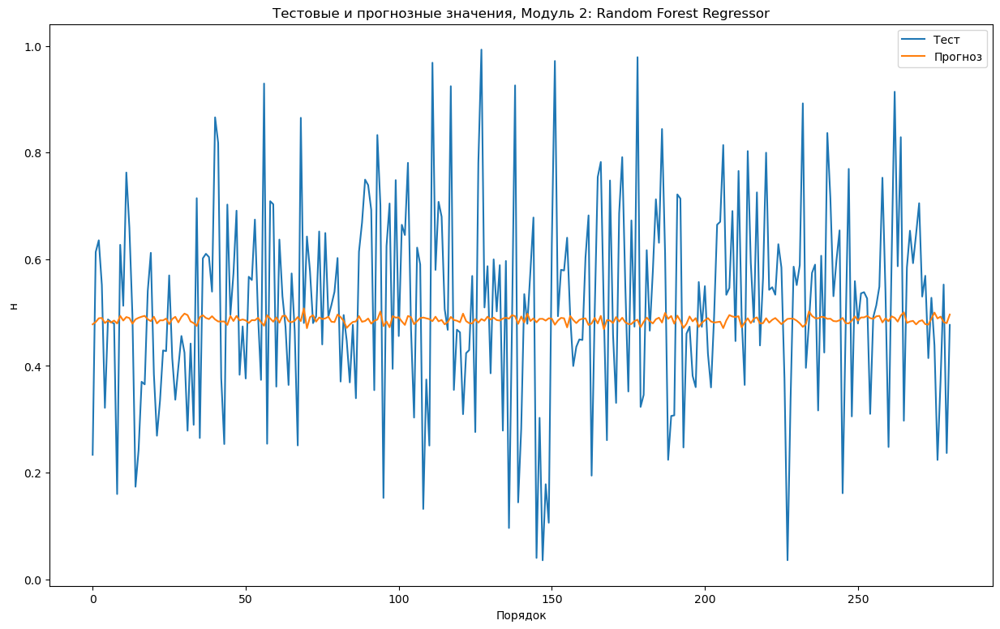

In [63]:
from sklearn.ensemble import RandomForestRegressor
# параметры для подстройки
model = RandomForestRegressor(random_state=14)
grid = {
    'n_estimators' : range(0, 101, 25),
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : range(1, 5, 1),
    
}
model_name = 'Random Forest Regressor'
loss_df = fit_model(model, model_name, grid,loss_df, y_test, y_pred)
model_list[-1]

In [64]:
loss_df

,model,target,MSE,MSE_0,MSE_1,R2,R2_0,R2_1
0,Linear Regression,Модуль упругости и Прочность,0.035074,0.034752,0.035396,-0.024522,-0.003601,-0.045443
1,KNeighborsRegressor,Модуль упругости и Прочность,0.034788,0.034654,0.034921,-0.016102,-0.000792,-0.031412
2,SVR,Модуль упругости и Прочность,0.034403,0.034629,0.034177,-0.004750,-0.000051,-0.009448
3,Random Forest Regressor,Модуль упругости и Прочность,0.034899,0.034837,0.034962,-0.019342,-0.006064,-0.032620


Рекомендательная нейросеть для соотношения матрица-наполнитель


In [51]:
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [65]:
y = df_n['Соотношение матрица-наполнитель']
X = df_n.drop(['Соотношение матрица-наполнитель'], axis = 1)

X_train, X_test, y_train,y_test = train_test_split(X, y , test_size=0.3, random_state=42)
y.shape,X.shape

((936,), (936, 12))

In [107]:
from keras.engine.sequential import Sequential
from keras import layers
from keras import models
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 1])
    plt.xlabel('Эпоха')

    plt.ylabel('MAE [MPG]')
    plt.legend()
    plt.grid(True)
model = Sequential()
model.add(layers.Dense(50, input_dim=X.shape[1], activation='tanh'))
#model.add(layers.Dropout(0.12))
model.add(layers.Dense(128, activation='tanh'))
#model.add(layers.Dropout(0.12))
#model.add(layers.Dense(19, activation='tanh'))
#model.add(layers.Dropout(0.12))
#model.add(layers.Dense(64, activation='tanh'))
model.add(layers.Dropout(0.12))
#model.add(layers.Dense(32, activation='tanh'))
model.add(layers.Dense(1))

In [108]:
model.summary()
dfmodel = model.compile(optimizer='sgd', loss='mae', metrics=['mae'])
history = model.fit(
    X_train,
    y_train,
    validation_split=0.2,
    verbose=1, epochs=50)


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 50)                650       
                                                                 
 dense_13 (Dense)            (None, 128)               6528      
                                                                 
 dropout_8 (Dropout)         (None, 128)               0         
                                                                 
 dense_14 (Dense)            (None, 1)                 129       
                                                                 
Total params: 7,307
Trainable params: 7,307
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
17/17 [==============================] - 2s 26ms/step - loss: 0.2278 - mae: 0.2278 - val_loss: 0.1814 - val_mae: 0.1814
Epoch 2/50
17/17 [==============================] - 0

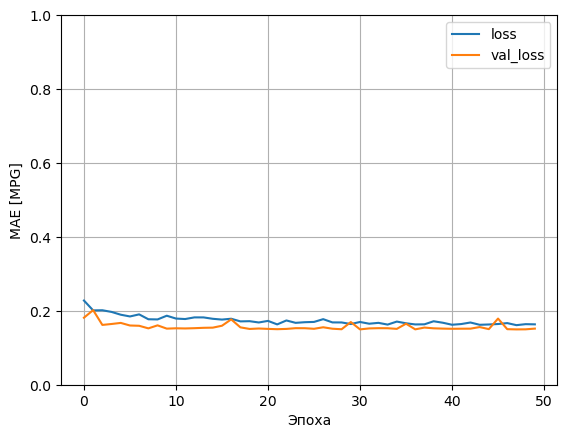

In [109]:
plot_loss(history)

Визуализация


9/9 [==============================] - 0s 3ms/step


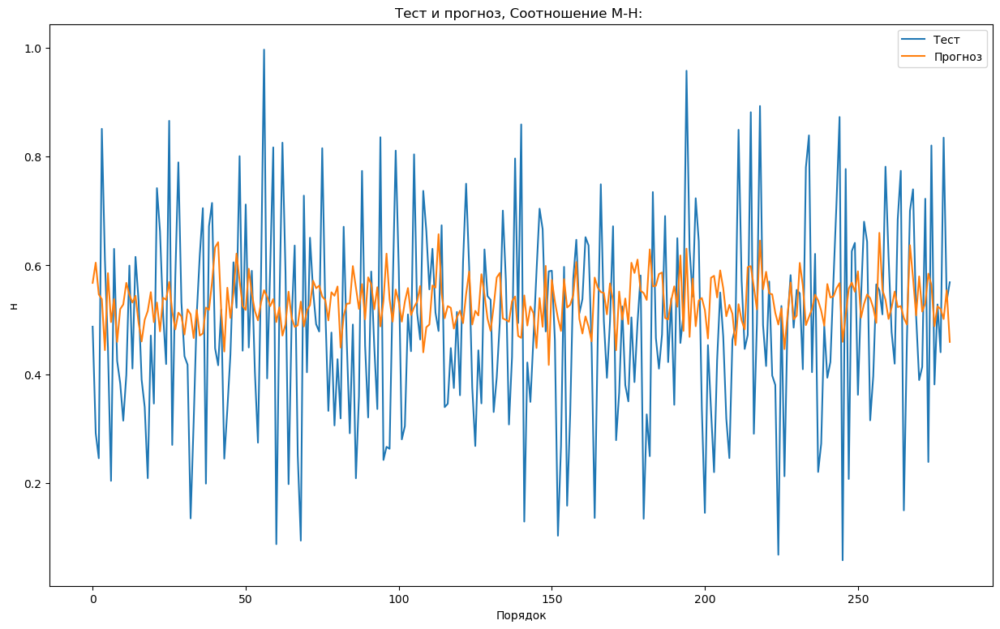

In [110]:
predicted_ns(y_test, model.predict(X_test))

Оценка MSE


In [111]:
model.evaluate(X_test, y_test, verbose=1)

9/9 [==============================] - 0s 4ms/step - loss: 0.1548 - mae: 0.1548


[0.15481257438659668, 0.15481257438659668]

Датасет с ошибками модели


In [112]:
MSE = mean_squared_error(y_test, model.predict(X_test.values))
R2 = r2_score(y_test, model.predict(X_test.values))

print(f'MSE NN = {MSE}')
print(f'R2_score NN = {R2}')

9/9 [==============================] - 0s 3ms/step
MSE NN = 0.035765161264707857
R2_score NN = -0.0669087760169833


In [80]:
loss_df

,model,target,MSE,MSE_0,MSE_1,R2,R2_0,R2_1
0,Linear Regression,Модуль упругости и Прочность,0.035074,0.034752,0.035396,-0.024522,-0.003601,-0.045443
1,KNeighborsRegressor,Модуль упругости и Прочность,0.034788,0.034654,0.034921,-0.016102,-0.000792,-0.031412
2,SVR,Модуль упругости и Прочность,0.034403,0.034629,0.034177,-0.004750,-0.000051,-0.009448
3,Random Forest Regressor,Модуль упругости и Прочность,0.034899,0.034837,0.034962,-0.019342,-0.006064,-0.032620


In [73]:
for model in model_list:
  print(model)

LinearRegression()
KNeighborsRegressor(n_neighbors=100)
MultiOutputRegressor(estimator=SVR(epsilon=0.5))
RandomForestRegressor(max_depth=1, max_features='sqrt', n_estimators=75,
                      random_state=14)


Для сохранения выбираем лучшую модель



In [ ]:
# model = model_list[2]
from joblib import dump, load
dump(model_list[0], 'filename.joblib')

In [ ]:
model_l = load('filename.joblib') 

In [ ]:
model_l

Приложение

In [ ]:
from joblib import dump, load
def input_variable():

  x1 = float(input('Введите значение переменной Соотношение матрица-наполнитель: '))
  x2 = float(input('Введите значение переменной Плотность: '))
  x3 = float(input('Введите значение переменной Модуль упругости: '))
  x4 = float(input('Введите значение переменной Количество отвердителя: '))
  x5 = float(input('Введите значение переменной Содержание эпоксидных групп: '))
  x6 = float(input('Введите значение переменной Температура вспышки: '))
  x7 = float(input('Введите значение переменной Поверхностная плотность: '))
  x8 = float(input('Введите значение переменной Потребление смолы: '))
  x9 = float(input('Введите значение переменной Угол нашивки: '))
  x10 = float(input('Введите значение переменной Шаг нашивки: '))
  x11 = float(input('Введите значение переменной Плотность нашивки: '))
  return x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11

def input_proc(X):
  print('вызов модели')
  res = model_l.predict(X)
  return res 

def app_model():
  scaler_x = load('minmax_x.joblin')
  scaler_y = load('minmax_y.joblin') 
  model_l = load('filename.joblib') 
  print('Приложение прогнозирует значения модулей упругости и растяжения')
  for i in range(110):
    try:
      print('введите 1 для прогноза, 2 для выхода')
      check = input()
      
      if check == '1':
        print('Введите данные')
        X = input_variable()
        X = scaler_x.transform(np.array(X).reshape(1,-1))
        print(['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'])
        print(scaler_y.inverse_transform(input_proc(X)))


      elif check == '2':
        break
      else:
        print('Повторите выбор')
    except:
      print('Неверные данные. Повторите операцию')
app_model()